In [4]:
import tempfile
from functools import partialmethod


from simtk import unit  # Unit handling for OpenMM
import openmm
from openmm import *
from openmm import app
from openmm.app import *
from openmm.app import PDBFile


from openff.toolkit.topology import Molecule, Topology
from openff.toolkit.typing.engines.smirnoff import ForceField

import parmed
from rdkit import Chem
import pickle
import shutil
import os
import numpy as np


from openff.evaluator.substances import Substance, Component, MoleFraction
from openff.evaluator.workflow.schemas import WorkflowSchema

from openff.evaluator.protocols.coordinates import BuildCoordinatesPackmol
from openff.evaluator.protocols.forcefield import BuildSmirnoffSystem
from openff.evaluator.workflow.utils import ProtocolPath

from openff.evaluator.thermodynamics import ThermodynamicState

from openff.evaluator.workflow import Workflow

from openff.evaluator import unit as openff_unit

import logging

Warning on use of the timeseries module: If the inherent timescales of the system are long compared to those being analyzed, this statistical inefficiency may be an underestimate.  The estimate presumes the use of many statistically independent samples.  Tests should be performed to assess whether this condition is satisfied.   Be cautious in the interpretation of the data.

****** PyMBAR will use 64-bit JAX! *******
* JAX is currently set to 32-bit bitsize *
* which is its default.                  *
*                                        *
* PyMBAR requires 64-bit mode and WILL   *
* enable JAX's 64-bit mode when called.  *
*                                        *
* This MAY cause problems with other     *
* Uses of JAX in the same code.          *
******************************************



In [5]:
#find all conf_ids that are NOT in cs_mdfps_schema.confid_data;
import psycopg2
conn = psycopg2.connect("dbname=cs_mdfps user=cschiebroek host=scotland")
cur = conn.cursor()
query = """

SELECT 
    e.molregno,
    c.conf_id,
    e.vp_log10_pa,
    m.mdfp,
    c.molblock,
    m.md_experiment_uuid,
    cd.confgen_uuid -- Add this column for confgen_uuid
FROM 
    cs_mdfps_schema.experimental_data e
JOIN 
    conformers c ON e.molregno = c.molregno
LEFT JOIN 
    cs_mdfps_schema.mdfp_experiment_data m ON c.conf_id = m.conf_id
LEFT JOIN 
    cs_mdfps_schema.confid_data cd ON c.conf_id = cd.conf_id; -- Join with confid_data for confgen_uuid


"""

cur.execute(query)
data = cur.fetchall()
import pandas as pd

df = pd.DataFrame(data, columns=['molregno', 'conf_id', 'vp_log10_pa', 'mdfp', 'molblock', 'md_experiment_uuid', 'confgen_uuid'])
df

df = df[df['md_experiment_uuid'] == '24e3946b-fb2c-47bf-9965-1682bb0d63c9']
df = df.dropna(subset=['mdfp'])
df


,molregno,conf_id,vp_log10_pa,mdfp,molblock,md_experiment_uuid,confgen_uuid
3263,2414,2412,-3.309299,"{'mdfp': '[17, 3, 3, 0, 0, 0, 0, 0, 0, 0, -110...",[H]c1c(C([H])([H])[H])nc(N([H])c2c([H])c([H])c...,24e3946b-fb2c-47bf-9965-1682bb0d63c9,906589dd-76fa-4d7b-aa9f-1ee90abe3835
3264,2422,2420,3.031002,"{'mdfp': '[7, 0, 2, 0, 0, 0, 0, 0, 0, 0, 226.3...",[H]c1nc([H])c(C([H])([H])[H])nc1[H]\n RDKi...,24e3946b-fb2c-47bf-9965-1682bb0d63c9,906589dd-76fa-4d7b-aa9f-1ee90abe3835
3265,2399,2397,-3.979000,"{'mdfp': '[19, 1, 0, 0, 0, 0, 0, 7, 0, 0, -18....",[H]c1c(Cl)c(Cl)c(Cl)c(-c2c([H])c(Cl)c(Cl)c(Cl)...,24e3946b-fb2c-47bf-9965-1682bb0d63c9,906589dd-76fa-4d7b-aa9f-1ee90abe3835
3266,44,1187,3.830901,"{'mdfp': '[5, 2, 0, 0, 0, 0, 1, 0, 0, 0, 4.332...",[H]C([H])([H])SC([H])([H])C([H])([H])C([H])([H...,24e3946b-fb2c-47bf-9965-1682bb0d63c9,906589dd-76fa-4d7b-aa9f-1ee90abe3835
3267,75,1218,3.931102,"{'mdfp': '[6, 2, 1, 3, 0, 0, 0, 0, 0, 0, -31.8...",[H]C([H])([H])C([H])([H])O[N+](=O)[O-]\n R...,24e3946b-fb2c-47bf-9965-1682bb0d63c9,906589dd-76fa-4d7b-aa9f-1ee90abe3835
...,...,...,...,...,...,...,...
18088,16996,16994,0.776202,"{'mdfp': '[13, 0, 0, 1, 0, 0, 0, 0, 0, 0, -67....",[H]Oc1c(C([H])([H])[H])c([H])c(C([H])([H])[H])...,24e3946b-fb2c-47bf-9965-1682bb0d63c9,2153b1f8-cb83-4974-86a3-249f49ab55b7
18089,3394,17254,2.296000,"{'mdfp': '[8, 0, 0, 1, 0, 0, 0, 0, 0, 0, -24.7...",[H]O[C@]1([H])C([H])([H])C([H])([H])C([H])([H]...,24e3946b-fb2c-47bf-9965-1682bb0d63c9,2153b1f8-cb83-4974-86a3-249f49ab55b7
18090,17082,17080,-6.890598,"{'mdfp': '[20, 0, 0, 0, 0, 0, 0, 0, 0, 0, -0.0...",[H]c1c([H])c([H])c2c([H])c3c(c([H])c2c1[H])-c1...,24e3946b-fb2c-47bf-9965-1682bb0d63c9,2153b1f8-cb83-4974-86a3-249f49ab55b7
18091,16763,16761,-4.275198,"{'mdfp': '[27, 7, 0, 5, 0, 0, 0, 0, 0, 0, -203...",[H]C([H])=C([H])/C([H])=C(\[H])C([H])([H])C1=C...,24e3946b-fb2c-47bf-9965-1682bb0d63c9,2153b1f8-cb83-4974-86a3-249f49ab55b7


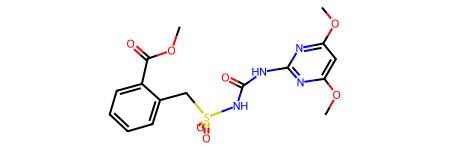

In [6]:
#sort df by vp_log10_pa
from rdkit import Chem
df = df.sort_values('vp_log10_pa')
df
#get top molblock
molblock = df.iloc[0]['molblock']
mol = Chem.MolFromMolBlock(molblock)
mol

In [7]:
smiles = Chem.MolToSmiles(mol)
smiles

'COC(=O)c1ccccc1CS(=O)(=O)NC(=O)Nc1nc(OC)cc(OC)n1'

In [19]:
smiles = Chem.MolToSmiles(mol)
substance = Substance()
substance.add_component(Component(smiles=smiles), MoleFraction(1.0))

schema = WorkflowSchema()
n_mols = 256
density = 0.95

# Step 1: Build coordinates
build_coordinates = BuildCoordinatesPackmol("build_coordinates")
build_coordinates.max_molecules = n_mols
build_coordinates.mass_density = density * openff_unit.grams / openff_unit.milliliters
build_coordinates.substance = substance
schema.protocol_schemas.append(build_coordinates.schema)

# Step 2: Assign parameters
assign_parameters = BuildSmirnoffSystem("assign_parameters")
force_field_path =  "openff_unconstrained-2.1.0.offxml"
assign_parameters.force_field_path = force_field_path
assign_parameters.coordinate_file_path = ProtocolPath("coordinate_file_path", build_coordinates.id)
assign_parameters.substance = substance
schema.protocol_schemas.append(assign_parameters.schema)

metadata = {
    "substance": substance,
    "thermodynamic_state": ThermodynamicState(
        temperature=298.15 * openff_unit.kelvin,
        pressure=1.0 * openff_unit.atmosphere
    ),
    "force_field_path": force_field_path
}

workflow = Workflow.from_schema(schema, metadata=metadata)
workflow.execute()

pdb_file = f'{workflow.schema.id}_build_coordinates/output.pdb'

In [1]:
import mdtraj as md
traj = md.load('/localhome/cschiebroek/MDFP_VP/mdfptools/carl/interface/low_vp_mol_T_300_t_5.h5')
traj.save('/localhome/cschiebroek/MDFP_VP/mdfptools/carl/interface/low_vp_mol_T_300_t_5.dcd')

/localhome/cschiebroek/.conda/envs/openff_evaluator_clone/lib/python3.11/site-packages/mdtraj/core/trajectory.py:441: UserWarning: top= kwargs ignored since this file parser does not support it
  warnings.warn("top= kwargs ignored since this file parser does not support it")


In [2]:
import mdtraj as md
traj = md.load('/localhome/cschiebroek/MDFP_VP/mdfptools/carl/interface/low_vp_mol_T_<350_t_5.h5')
traj.save('/localhome/cschiebroek/MDFP_VP/mdfptools/carl/interface/low_vp_mol_T_350_t_5.dcd')

In [39]:
import mdtraj as md
traj = md.load('/localhome/cschiebroek/MDFP_VP/mdfptools/carl/interface/trajectories/2412.h5')
traj.save('/localhome/cschiebroek/MDFP_VP/mdfptools/carl/interface/trajectories/2412.dcd')

/localhome/cschiebroek/.conda/envs/openff_evaluator_clone/lib/python3.11/site-packages/mdtraj/core/trajectory.py:441: UserWarning: top= kwargs ignored since this file parser does not support it
  warnings.warn("top= kwargs ignored since this file parser does not support it")


In [40]:
import mdtraj as md
traj = md.load('/localhome/cschiebroek/MDFP_VP/mdfptools/carl/interface/trajectories/2412_600K_5ns.h5')
traj.save('/localhome/cschiebroek/MDFP_VP/mdfptools/carl/interface/trajectories/2412_600K_5ns.dcd')

/localhome/cschiebroek/.conda/envs/openff_evaluator_clone/lib/python3.11/site-packages/mdtraj/core/trajectory.py:441: UserWarning: top= kwargs ignored since this file parser does not support it
  warnings.warn("top= kwargs ignored since this file parser does not support it")


In [31]:
from rdkit.Chem.MolStandardize.rdMolStandardize import ChargeParent 

df_exp = pd.read_csv('/localhome/cschiebroek/MDFP_VP/mdfptools/carl/data_curation/cs_mdfps_schema_experimental_data.csv')
opera_test = pd.read_csv('/localhome/cschiebroek/PhysPropMTL/Digital_Chemistry/data/test.csv')
opera_train = pd.read_csv('/localhome/cschiebroek/PhysPropMTL/Digital_Chemistry/data/train.csv')
#combine them
opera = pd.concat([opera_test,opera_train])
opera['inchikey'] = opera['SMILES'].apply(lambda x: Chem.MolToInchiKey(ChargeParent(Chem.MolFromSmiles(x))))
opera
print(len(opera),len(opera_test),len(opera_train))
#keep onloy those where vp is not nan
opera = opera[~opera['LogVP'].isna()]
opera

[15:07:55] Initializing MetalDisconnector
[15:07:55] Running MetalDisconnector
[15:07:55] Initializing Normalizer
[15:07:55] Running Normalizer
[15:07:55] Running LargestFragmentChooser
[15:07:55] Running Uncharger
[15:07:55] Initializing MetalDisconnector
[15:07:55] Running MetalDisconnector
[15:07:55] Initializing Normalizer
[15:07:55] Running Normalizer
[15:07:55] Initializing MetalDisconnector
[15:07:55] Running MetalDisconnector
[15:07:55] Initializing Normalizer
[15:07:55] Running Normalizer
[15:07:55] Running LargestFragmentChooser
[15:07:55] Running Uncharger
[15:07:55] Initializing MetalDisconnector
[15:07:55] Running MetalDisconnector
[15:07:55] Initializing Normalizer
[15:07:55] Running Normalizer
[15:07:55] Initializing MetalDisconnector
[15:07:55] Running MetalDisconnector
[15:07:55] Initializing Normalizer
[15:07:55] Running Normalizer
[15:07:55] Running LargestFragmentChooser
[15:07:55] Running Uncharger
[15:07:55] Initializing MetalDisconnector
[15:07:55] Running MetalD

23228 4646 18582


[15:08:31] Initializing MetalDisconnector
[15:08:31] Running MetalDisconnector
[15:08:31] Initializing Normalizer
[15:08:31] Running Normalizer
[15:08:31] Running LargestFragmentChooser
[15:08:31] Running Uncharger
[15:08:31] Initializing MetalDisconnector
[15:08:31] Running MetalDisconnector
[15:08:31] Initializing Normalizer
[15:08:31] Running Normalizer
[15:08:31] Initializing MetalDisconnector
[15:08:31] Running MetalDisconnector
[15:08:31] Initializing Normalizer
[15:08:31] Running Normalizer
[15:08:31] Running LargestFragmentChooser
[15:08:31] Running Uncharger
[15:08:31] Initializing MetalDisconnector
[15:08:31] Running MetalDisconnector
[15:08:31] Initializing Normalizer
[15:08:31] Running Normalizer
[15:08:31] Initializing MetalDisconnector
[15:08:31] Running MetalDisconnector
[15:08:31] Initializing Normalizer
[15:08:31] Running Normalizer
[15:08:31] Running LargestFragmentChooser
[15:08:31] Running Uncharger
[15:08:31] Initializing MetalDisconnector
[15:08:31] Running MetalD

KeyError: 'inchikey'

In [34]:
#combine on inchikey
df_exp['inchikey'] = df_exp['molblock'].apply(lambda x: Chem.MolToInchiKey(Chem.MolFromMolBlock(x)))
combined = pd.merge(df_exp,opera,how='inner',on='inchikey')
liquids = combined[(combined['MP'] < 25) & (combined['BP'] > 25)]
solids = combined[(combined['MP'] > 25)]
gases = combined[(combined['BP'] < 25)]
len(liquids),len(solids),len(gases),len(combined)

(788, 591, 70, 1864)

In [53]:
combined['MP'].isna().sum()
#number of non-nan values
combined['MP'].notna().sum()

1496

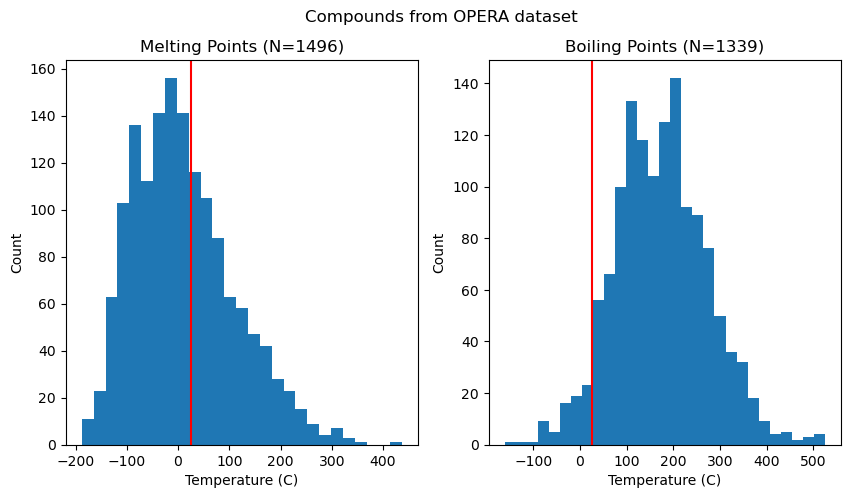

In [54]:
#histograms of melting points and boiling points. 2 subplots
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(10,5))
axs[0].hist(combined['MP'],bins='auto')
axs[0].set_title(f"Melting Points (N={combined['MP'].notna().sum()})")
axs[1].hist(combined['BP'],bins='auto')
axs[1].set_title(f"Boiling Points (N={combined['BP'].notna().sum()})")
#axis labels
for ax in axs:
    ax.set_xlabel('Temperature (C)')
    ax.set_ylabel('Count')
#set vertical red line at 25C
for ax in axs:
    ax.axvline(x=25, color='r')
#add title: compounds from OPERA dataset
plt.suptitle('Compounds from OPERA dataset')
plt.show()



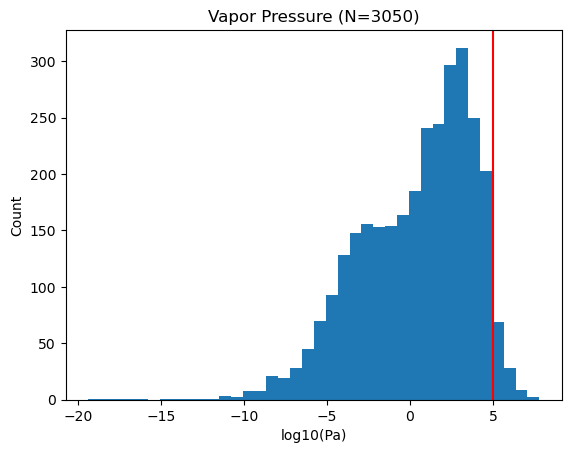

In [56]:
#also histogram of vp_log10_pa form df_exp
df_exp['vp_log10_pa'].isna().sum()
plt.hist(df_exp['vp_log10_pa'],bins='auto')
plt.title(f"Vapor Pressure (N={df_exp['vp_log10_pa'].notna().sum()})")
plt.xlabel('log10(Pa)')
plt.ylabel('Count')
#y line at 5
plt.axvline(x=5, color='r')
plt.show()


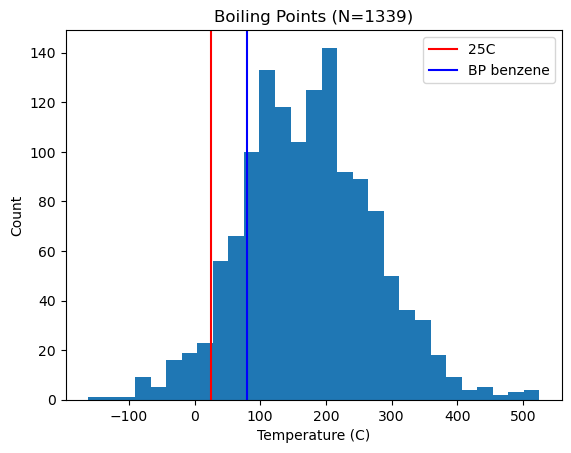

In [59]:
#now only boiling point
combined['BP'].isna().sum()
plt.hist(combined['BP'],bins='auto')
plt.title(f"Boiling Points (N={combined['BP'].notna().sum()})")
plt.xlabel('Temperature (C)')
plt.ylabel('Count')
plt.axvline(x=25, color='r')
plt.axvline(x=80, color='b')
#legend
plt.legend(['25C','BP benzene'])
plt.show()


In [3]:
#load 2412_600K_5ns.h5
import mdtraj as md
traj = md.load('/localhome/cschiebroek/MDFP_VP/mdfptools/carl/interface/trajectories/2412_600K_5ns.h5')
traj.save('/localhome/cschiebroek/MDFP_VP/mdfptools/carl/interface/trajectories/2412_600K_5ns.dcd')

In [6]:
traj.save('/localhome/cschiebroek/MDFP_VP/mdfptools/carl/interface/trajectories/2412_600K_5ns.dcd')

In [5]:
traj

<mdtraj.Trajectory with 500 frames, 8192 atoms, 256 residues, and unitcells at 0x7396110cd590>

In [8]:
#load the dcd
import mdtraj as md
traj = md.load('/localhome/cschiebroek/MDFP_VP/mdfptools/carl/interface/trajectories/2412_600K_5ns.dcd',top='/localhome/cschiebroek/MDFP_VP/mdfptools/carl/interface/389c8ef47e814d9b8a9b930d1dee48f0_build_coordinates/output.pdb')
traj

ValueError: The topology and the trajectory files might not contain the same atoms
The input topology must contain all atoms even if you want to select a subset of them with atom_indices

In [11]:
#open /localhome/cschiebroek/MDFP_VP/mdfptools/carl/interface/topologies/24e3946b-fb2c-47bf-9965-1682bb0d63c9/2412.pickle
import pickle
top_2412 = pickle.load(open('/localhome/cschiebroek/MDFP_VP/mdfptools/carl/interface/topologies/24e3946b-fb2c-47bf-9965-1682bb0d63c9/2412.pickle','rb'))
top_2412

<Structure 8192 atoms; 256 residues; 8704 bonds; PBC (orthogonal); parameterized>

In [12]:
#save as pdb
top_2412.save('/localhome/cschiebroek/MDFP_VP/mdfptools/carl/interface/topologies/24e3946b-fb2c-47bf-9965-1682bb0d63c9/2412.pdb')

AttributeError: 'Structure' object has no attribute 'symmetry'

In [13]:
#save as prmtop
top_2412.save('/localhome/cschiebroek/MDFP_VP/mdfptools/carl/interface/topologies/24e3946b-fb2c-47bf-9965-1682bb0d63c9/2412.prmtop')
#load with mdtraj
import mdtraj as md
traj = md.load('/localhome/cschiebroek/MDFP_VP/mdfptools/carl/interface/trajectories/2412_600K_5ns.dcd',top='/localhome/cschiebroek/MDFP_VP/mdfptools/carl/interface/topologies/24e3946b-fb2c-47bf-9965-1682bb0d63c9/2412.prmtop')
traj

<mdtraj.Trajectory with 500 frames, 8192 atoms, 256 residues, and unitcells at 0x7395fb5cb1d0>

In [16]:
#save top as pdb, traj as dcd, in current dir
traj.save('2412.dcd')

In [19]:
traj.topology.save('2412.pdb')

AttributeError: 'Topology' object has no attribute 'save'

In [20]:
#save whole traj as pdb?
traj.save('2412_whole.pdb')